In [1]:
options(warn=-1)
library(cowplot);library(ggpubr)
#library(patchwork)

library(dplyr);library(tidyverse)
library(data.table);library(Matrix)
library(magrittr)

library(viridis);library(tibble)
library(scales)
library(ggrepel);library(forcats)

library(Seurat);library(SingleCellExperiment)
library(parallel)
memory.limit(size = 98226*1024)
library(indRop)
library(scDblFinder)
# Pass TRUE if you want to see progress output on some of Monocle 3's operations
DelayedArray:::set_verbose_block_processing(TRUE)

# Passing a higher value will make some computations faster but use more memory. Adjust with caution!
options(DelayedArray.block.size=1000e6)

base::gc()
base::rm(list = ls()) # Clear the environment
GSE118918.marker <- c(
"Pdgfra","Vcan","Olig1","Ptprz1","Olig2", # opc
"Plp1","Cldn11","Cnp","Tspan2","Mobp", 
"Trf","Apod","Ermn","Car2",
"Ptgds","Plp1","Mal","Cryab","Car2", # 
"Fyn","Sirt2","Tuba1a","Bcas1","Enpp6", # cop
"Hexb","Ctss","C1qb","C1qc","Cx3cr1", # micro
"Lyz2","Mrc1","Pf4","Ctsb","F13a1", # macrophage
"Ly6c1","Ly6a","Flt1","Itm2a","Slco1a4", # Endothelial
"Rgs5","Acta2","Myl9","Tagln","Cald1", # Mural
"Dcn","Col1a2","Igf2","Igfbp2","Pcolce",#VLMC
"Ccdc153","Rarres2","Tmem212","Nnat","Rsph1", # Ependyma    
"Cpe","Apoe","Cst3","Mt1","Dbi","Aldoc","Gja1","Slc1a2","Slc1a3","Clu", 
"Ccnd2","Tubb5","Dlx1","Tmsb10","Tuba1a", #NSC
"Hmgb2","Top2a","Hmgn2","Tubb5","H2afz", # NSC    
"Sst","Npy","Resp18","Nap1l5","Nos1", # NEURON
"Lypd1","Meg3","Atp1b1","Snhg11","Olfm1",# NEURON
"Penk","Arpp21","Ppp3ca","Atp2b1","Hpca" #NEURON
)

oligo.mark <- c("Sirt2","Bmp4","Tnr","Fyn", "Enpp6", "Neu4",  # COP 
                  "C1ql1", "Olig1", "Pdgfra", "Cspg4",# OPC
                  "Apod", "Trf", "Plp1", "Mbp", "Fth1","Mag", "Mog","Cldn11","Mobp", # MOL
                  "Tmeff2","Idh1","Neu4", "Cdh20", "Tmem163", "Nfasc", "Mpzl1", # NFOL
                  "Mal","Opalin", "Ptgds","Bfsp2" #MFOL
                 )

setwd('~/R')
source('~/R/single_cell_function_20220408.R')
library(readxl)

sheet1 <- c("NSC","NPC", "OPC", "COP", "MFOL", 
           "MICRO", "CD45", "PERICYTE", "INTERNEURON")
gene1 <- GSE106447.MARKER.ALL <- list()
for(i in seq(1:9)){
    temp1 <-  read_excel(paste0(file.path("/home","choelab","working","public_dataset","GSE106447"),"/GSE106447.xlsx"), col_names=T, sheet = i)
    gene1[[i]] <- temp1$`GENE ID`[1:5]
    GSE106447.MARKER.ALL[[i]] <-  temp1$`GENE ID`
}    
GSE106447.MARKER <- unique(unlist(gene1))
names(GSE106447.MARKER.ALL) <- sheet1

# SMCs, smooth muscle cells; PVMs, perivascular macrophages; MSNs, medium spiny neurons,
sheet <- c("Endothelial_Cells","Pericyte", "SMC", "Microglia", "PVM", 
           "Ependymal", "MSN1", "MSN2", "COP", "MOL",
           "MFOL2", "MFOL1", "Neuroblast", "TAP", "OPC", 
           "Astrocyte", "NSC")
gene <- GSE111527.MARKER.ALL <- list()
for(i in seq(1:17)){
    temp <-  read_excel(paste0(file.path("/home","choelab","working","public_dataset","GSE111527"),"/GSE111527MARKER.xlsx"), col_names=T, sheet = i)
    gene[[i]] <- temp$gene[1:5]
    GSE111527.MARKER.ALL[[i]] <- temp$gene
}    
GSE111527.MARKER <- unique(unlist(gene))
names(GSE111527.MARKER.ALL) <- sheet


Loading required package: ggplot2


Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ tibble  3.1.8     ✔ purrr   0.3.5
✔ tidyr   1.2.1     ✔ stringr 1.4.1
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘data.table’


The following object is masked from ‘package:purrr’:

    transpose


The following objects are masked from ‘package:dplyr’:

    between, first, last



Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



Attaching 

[1] Inf

[1] FALSE

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,10342601,552.4,16546434,883.7,14067049,751.3
Vcells,17555239,134.0,25954272,198.1,21561488,164.6


Loading required package: httr


Attaching package: ‘httr’


The following object is masked from ‘package:Biobase’:

    content


Loading required package: nichenetr



In [4]:
# GSE180041.meta <- read.table(paste0(pathIMZ,"/",list.files(pathIMZ, pattern = "GSE180041_tsne_coordinates_and_cluster_labels_all_cells.csv")), header =T, sep=",")
pathIMZ <- file.path("/home","choelab","working","OL_sorted","reference","GSE153895","raw")
fileListCNTs <- list.files(pathIMZ, pattern = ".txt.gz")
# fileListCNTs <- list.files(pathIMZ, pattern = "GSE180041_exonic_norm_umi.csv.gz")
path_in_counts.raw <- paste0(pathIMZ,"/",fileListCNTs)
path_in_counts.raw
names(fileListCNTs) <- path_in_counts.raw


[1] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658243_SAM24362767.txt.gz"
 [2] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658244_SAM24362768.txt.gz"
 [3] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658245_SAM24362771.txt.gz"
 [4] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658246_SAM24362772.txt.gz"
 [5] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658247_SAM24362773.txt.gz"
 [6] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658248_SAM24362774.txt.gz"
 [7] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658249_SAM24362775.txt.gz"
 [8] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658250_SAM24362776.txt.gz"
 [9] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658251_SAM24362777.txt.gz"
[10] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658252_SAM24362778.txt.gz"
[11] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658253_SAM24364585.txt.gz"
[12] "/home/choelab/working/OL_sorted/reference/GSE153895/raw/GSM4658254_SAM24364586.txt.gz"

In [5]:
GSE153895.meta <- read.table("/home/choelab/working/OL_sorted/reference/GSE153895/GSE153895_TsneCoordinatesAndClusterAssignments.txt.gz", header =T, sep="\t")
GSE153895.meta <- GSE153895.meta %>% tibble::column_to_rownames('cellID')

In [8]:
table(GSE153895.meta$genotype)


                NonTg                 P301L         PS2/APP/P301L 
                12548                 19807                 12768 
PS2/APP/P301L/TREM2KO               TREM2KO 
                15962                  4917 

In [6]:
require(biomaRt)
annot <- c()
GSE153895.obj <- list()
ensembl <- useMart('ensembl', dataset = 'mmusculus_gene_ensembl')

for(x in path_in_counts.raw){
    temp <- readIndrop(x)
    annot <- getBM(attributes = c('mgi_symbol','ensembl_gene_id'),filters = 'ensembl_gene_id',values = colnames(temp),mart = ensembl)
    annot <- annot[-c(which((annot$mgi_symbol == '') | duplicated(annot$mgi_symbol) | duplicated(annot$ensembl_gene_id))),]
    temp <- temp[,annot$ensembl_gene_id]
    colnames(temp) <- gsub("-","\\.", annot$mgi_symbol)

    GSE153895.obj[[fileListCNTs[x]]] <- CreateSeuratObject(counts = t(temp), min.cells = 0)               
}


Loading required package: biomaRt



In [7]:

GSE153895.obj.OL <- list()

for(x in path_in_counts.raw){
    y <- fileListCNTs[x]
    GSE153895.obj[[y]]$GSE153895.celltype <- GSE153895.meta[colnames(GSE153895.obj[[y]]),]$allCells.cluster.interpretation
    GSE153895.obj[[y]]$GSE153895.genotype <- GSE153895.meta[colnames(GSE153895.obj[[y]]),]$genotype

    GSE153895.obj[[y]]$id <- fileListCNTs[x]
    GSE153895.obj[[y]]$basic <- "GSE153895"
    GSE153895.obj[[y]]$percent.mt <- PercentageFeatureSet(GSE153895.obj[[y]], pattern = paste0(c(mt.genes,"^mt."), collapse = "|"))
    GSE153895.obj[[y]]$percent.hb <- PercentageFeatureSet(GSE153895.obj[[y]], pattern = paste0(c('Hbq1a','Hbb.y','Hbb.bh1','Hbb.bs','Hba.x','Hba.a2','Hba.a1','Hbq1b','Hbb.bt','Hbb.bh2','Hbb.bh3','Hba.ps4','Hbb.bh0'), collapse = "|"))
    GSE153895.obj.OL[[y]] <- GSE153895.obj[[y]][, grep("^oligo|^OPC|^COP|C15", GSE153895.obj[[y]]$GSE153895.celltype)]

}


In [8]:
grep("^Hb", rownames(GSE153895.obj[[4]]), value=T)


[1] "Hbp1"    "Hbs1l"   "Hbq1a"   "Hbegf"   "Hbb.y"   "Hbb.bh1" "Hbb.bs" 
 [8] "Hba.x"   "Hba.a2"  "Hba.a1"  "Hbq1b"   "Hbb.bt"  "Hbb.bh2" "Hbb.bh3"
[15] "Hba.ps4" "Hbb.bh0"

In [51]:
  PercentageFeatureSet(GSE153895.obj[[4]], pattern = paste0(c('Hbq1a','Hbb.y','Hbb.bh1','Hbb.bs','Hba.x','Hba.a2','Hba.a1','Hbq1b','Hbb.bt','Hbb.bh2','Hbb.bh3','Hba.ps4','Hbb.bh0'), collapse = "|"))


,nCount_RNA
,<dbl>
CELL3831476,0
CELL3831477,0
CELL3831478,0
CELL3831479,0
CELL3831480,0
CELL3831481,0
CELL3831482,0
CELL3831483,0
CELL3831484,0


In [9]:
# PROCESS 1
GSE153895.merge <- merge(GSE153895.obj[[1]], y= c(GSE153895.obj[2:length(GSE153895.obj)]), project = 'merged',merge.data=T)

GSE153895.merge <- GSE153895.merge %>%
                  SCTransform(assay = 'RNA',      
                              new.assay.name = 'SCT',  
                              vars.to.regress = c("percent.mt","percent.hb","nFeature_RNA"),
                              verbose = T)   # normalize data with SCTransform()

GSE153895.merge <- FindVariableFeatures(GSE153895.merge, assay = "SCT",   nfeatures = 2000)

pcs <- 1:30
set.seed(1234)
library(harmony)
DefaultAssay(GSE153895.merge) <- "SCT"

GSE153895.merge <- GSE153895.merge %>%
                          RunPCA(verbose = FALSE, assay = "SCT", features = VariableFeatures(GSE153895.merge) ) %>%
                          RunHarmony(group.by=c("id"), assay.use = "SCT", dims=pcs) %>% 
                          RunUMAP(reduction = "harmony", umap.method = "umap-learn", assay = "SCT",  dims=pcs) %>%
                          FindNeighbors(reduction = "harmony", dims=pcs, assay = "SCT") %>%
                          FindClusters(resolution = seq(0.1,1,0.1), algorithm = 2)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 29938 by 66002

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 117 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 29938 genes



  |======================================================================| 100%


Computing corrected count matrix for 29938 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.380694 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.hb, nFeature_RNA

Centering data matrix

Set default assay to SCT

Loading required package: Rcpp

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10

Harmony converged after 10 iterations

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9758
Number of communities: 17
Elapsed time: 39 seconds


1 singletons identified. 16 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9587
Number of communities: 22
Elapsed time: 28 seconds


1 singletons identified. 21 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9451
Number of communities: 26
Elapsed time: 27 seconds


1 singletons identified. 25 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9351
Number of communities: 26
Elapsed time: 25 seconds


1 singletons identified. 25 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9267
Number of communities: 27
Elapsed time: 22 seconds


1 singletons identified. 26 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9197
Number of communities: 28
Elapsed time: 27 seconds


1 singletons identified. 27 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9131
Number of communities: 33
Elapsed time: 24 seconds


1 singletons identified. 32 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9079
Number of communities: 34
Elapsed time: 23 seconds


1 singletons identified. 33 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9022
Number of communities: 39
Elapsed time: 20 seconds


1 singletons identified. 38 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66002
Number of edges: 2336130

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.8980
Number of communities: 41
Elapsed time: 21 seconds


1 singletons identified. 40 final clusters.



In [ ]:
GSE153895.merge <- readRDS(paste0(file.path("/home","choelab","working","OL_sorted","reference"),"/GSE153895.merge.rds"))

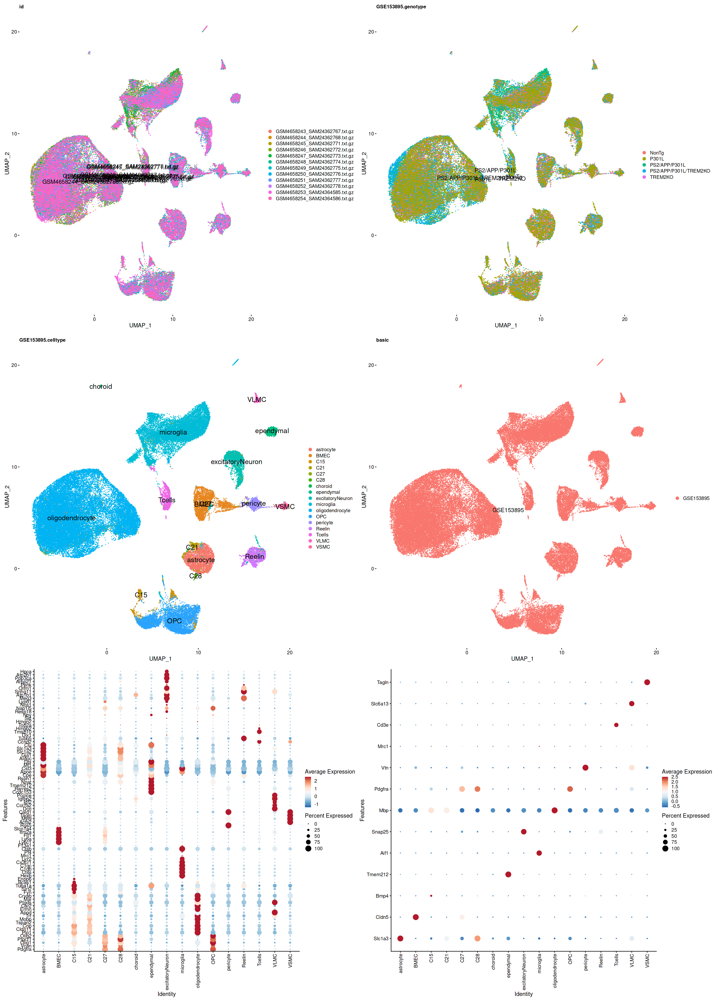

In [126]:
options(repr.plot.width = 25, repr.plot.height = 35)
p1 <- list()
p1[[1]] <- DimPlot(GSE153895.merge, reduction = "umap", group.by = "id", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0),  axis.line = element_blank())
p1[[2]] <- DimPlot(GSE153895.merge, group.by = "GSE153895.genotype", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0), axis.line = element_blank())
p1[[4]] <- DimPlot(GSE153895.merge, group.by = "GSE153895.celltype", label =T, label.size = 6, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0), axis.line = element_blank())
p1[[5]] <- DimPlot(GSE153895.merge, group.by = "basic", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0),  axis.line = element_blank())
p1[[6]] <- DotPlot(GSE153895.merge, group.by = "GSE153895.celltype", features = unique(GSE118918.marker), assay="SCT" , cols ="RdBu") + coord_flip() + 
           theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
p1[[7]] <- DotPlot(GSE153895.merge, group.by = "GSE153895.celltype", features = c(c("Slc1a3",# astrocyte; 
                                                                                    "Cldn5", #(BMEC); 
                                                                                    "Bmp4", #(COP); 
                                                                                    "Tmem212", #ependymal cell; 
                                                                                    "Aif1", # microglia; 
                                                                                    "Snap25", #neuron; 
                                                                                    "Mbp", #oligodendrocyte; 
                                                                                    "Pdgfra", #OPC; 
                                                                                    "Vtn", #pericyte, 
                                                                                    "Mrc1", #perivascular macrophage (PVM); 
                                                                                    "Cd3e", #T cell; 
                                                                                    "Slc6a13", # (VLMC); 
                                                                                    "Tagln")  # (VSMC).
                                                                              ), assay="SCT" , cols ="RdBu") + coord_flip() + 
           theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
plot_grid(p1[[1]],p1[[2]], p1[[4]], p1[[5]], p1[[6]], p1[[7]], ncol=2) 

# "Ccnd2","Tubb5","Dlx1","Tmsb10","Tuba1a", #NSC
# "Hmgb2","Top2a","Hmgn2","Tubb5","H2afz", # NSC    

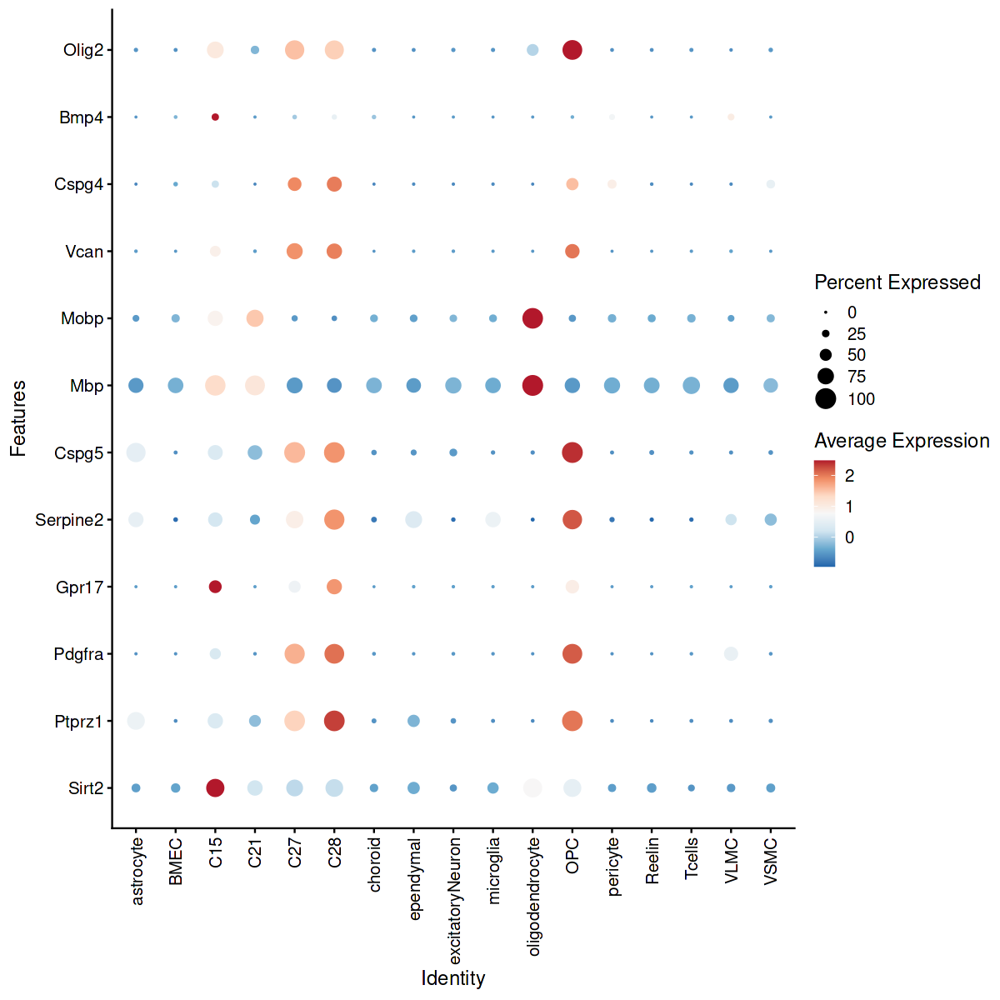

In [128]:
options(repr.plot.width = 10, repr.plot.height = 10)

DotPlot(GSE153895.merge, group.by = "GSE153895.celltype", features = c("Sirt2","Ptprz1","Pdgfra","Gpr17","Serpine2","Cspg5",
                                                                             "Mbp","Mobp",
                                                                             "Vcan","Cspg4","Bmp4","Olig2" ), assay="SCT" , cols ="RdBu") + coord_flip() + 
           theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

In [12]:
saveRDS(GSE153895.merge, paste0(file.path("/home","choelab","working","OL_sorted","reference"),"/GSE153895.merge.rds"))

In [14]:
table(GSE153895.merge$GSE153895.genotype)


                NonTg                 P301L         PS2/APP/P301L 
                12548                 19807                 12768 
PS2/APP/P301L/TREM2KO               TREM2KO 
                15962                  4917 

In [13]:
GSE153895.merge.oligo <- GSE153895.merge[,grep("^OPC|^oligo|COP|C15", GSE153895.merge$GSE153895.celltype)]
saveRDS(GSE153895.merge.oligo, paste0(file.path("/home","choelab","working","OL_sorted","reference"),"/GSE153895.merge.oligo.rds"))

In [2]:
GSE153895.merge <- readRDS(paste0(file.path("/home","choelab","working","OL_sorted","reference"),"/GSE153895.merge.rds"))

In [44]:
GSE153895.merge$GSE153895.celltype2 <- GSE153895.merge$GSE153895.celltype
GSE153895.merge$GSE153895.celltype2[GSE153895.merge$GSE153895.celltype == "C15"] <- "COP"
GSE153895.merge$GSE153895.genotype2 <- GSE153895.merge$GSE153895.genotype
GSE153895.merge$GSE153895.genotype2[GSE153895.merge$GSE153895.genotype == "NonTg"] <- "WT"

In [45]:
GSE153895.merge.sub <- GSE153895.merge[,grep("^NonTg|^P301L", GSE153895.merge$GSE153895.genotype)]
GSE153895.merge.sub.oligo <- GSE153895.merge.sub[,grep("^OPC|^oligo|COP|C15", GSE153895.merge.sub$GSE153895.celltype)]


In [46]:
GSE153895.merge
GSE153895.merge.sub

An object of class Seurat 
78929 features across 66002 samples within 2 assays 
Active assay: SCT (29938 features, 2000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

An object of class Seurat 
78929 features across 32355 samples within 2 assays 
Active assay: SCT (29938 features, 2000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

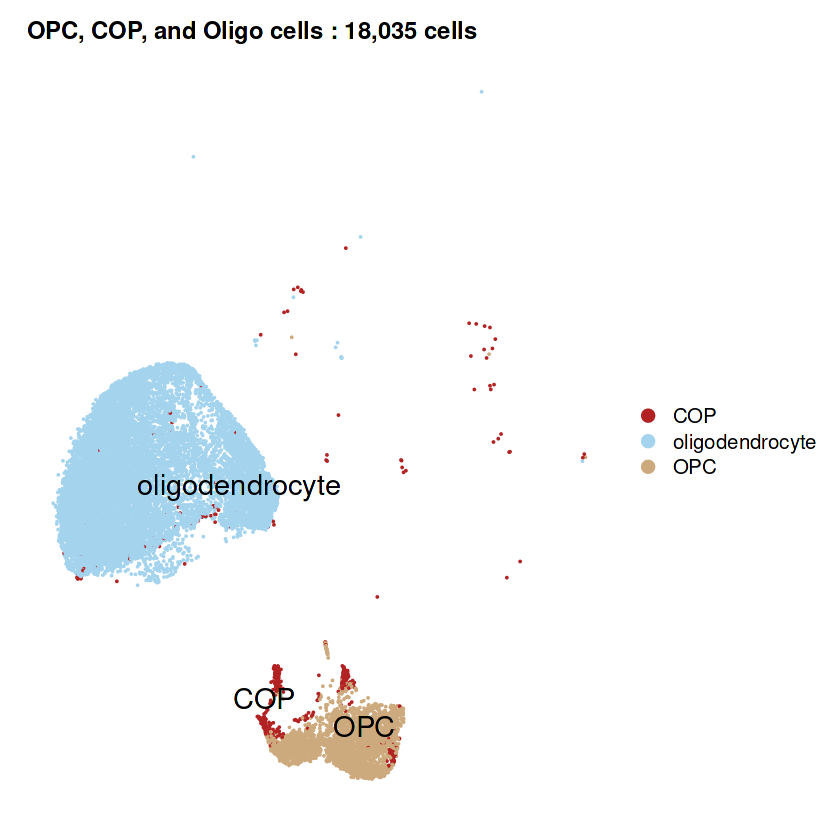

In [108]:

# kelly.colours <- c("gray95", "gray13", "gold2", "plum4", "darkorange1", "lightskyblue2", "firebrick", "burlywood3", "gray51", "springgreen4", "lightpink2", "deepskyblue4", "lightsalmon2", "mediumpurple4", "orange", "maroon", "yellow3", "brown4", "yellow4", "sienna4", "chocolate", "gray19")
kelly.colours <- c("firebrick", "lightskyblue2", "burlywood3")

options(repr.plot.width = 7, repr.plot.height = 7)
p1 <- list()

p1[[1]] <-DimPlot(GSE153895.merge.sub.oligo, 
        sizes.highlight=0.1,
        # cells.highlight = colnames(GSE160512.merge.oligo),
        # cols.highlight= brewer.pal(12,"Set3")[1:3],
        reduction = "umap", group.by = "GSE153895.celltype2", label = T, repel = T, 
        label.size = 6, pt.size = 0.01, 
        cols = kelly.colours) + 
  theme( axis.title = element_blank(), 
        plot.title = element_text(size = 14, face = "bold",hjust = 0), axis.line = element_blank(), 
        axis.text = element_blank(),  axis.ticks = element_blank()) + 
  ggtitle(paste0("OPC, COP, and Oligo cells : ",comma(length(colnames(GSE153895.merge.sub.oligo)),format="d")," cells"))


 
p1[[1]]

In [109]:

require("scProportionTest")
prop_test <- sc_utils(GSE153895.merge.sub.oligo)

prop_test.1 <- permutation_test(
  prop_test, cluster_identity = "GSE153895.celltype2",
  sample_1 = "WT", sample_2 = "P301L",
  sample_identity = "GSE153895.genotype2"
)

p1[[2]] <- permutation_plot(prop_test.1,FDR_threshold = 0.01, log2FD_threshold = log2(1.2))+
  theme(legend.position = 'bottom', 
        legend.title = element_text(size = 12, hjust = 0),
        legend.text = element_text(size = 10),
        axis.title = element_text(size = 12, face = "bold"),
        axis.text = element_text(size = 10))+
  ggtitle("P301L vs WT") +
  theme(plot.title = element_text(size = 14, face = "bold",hjust = 0))

options(repr.plot.width=15, repr.plot.height=10)

In [110]:

library(dittoSeq)
pt <- prop.table(table(GSE153895.merge.sub.oligo$GSE153895.celltype2, GSE153895.merge.sub.oligo$GSE153895.genotype2), margin = 2)
pt <- as.data.frame(pt)
pt$Var1 <- as.character(pt$Var1)

# selLabel<-intersect(prop_test@results$permutation$clusters[prop_test@results$permutation$FDR<0.01],
#                     prop_test@results$permutation$clusters[abs(prop_test@results$permutation$obs_log2FD)>0.53])
# library(ggrepel)
# prop.table(table(Idents(combined), combined$id_new), margin = 2)
p1[[3]] <- ggplot(pt, aes(x = Var2, y = Freq, fill = reorder(Var1,1:dim(pt)[1]), label = ifelse(Freq>0.025,scales::percent(Freq, accuracy=.1),""))) +
  theme_bw(base_size = 15) +
  theme(panel.border = element_blank(), panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))+
  geom_col(position = "fill", width = 0.5) +
  geom_text_repel(position = position_fill(vjust = 0.5), 
            vjust=0.2,
            hjust=-0.1,
            size = 5,
            max.overlaps = 10,
            box.padding = unit(0.5, "lines"),
            direction = "y") + 
  theme(axis.title = element_blank(), axis.line = element_blank(),
        axis.ticks = element_blank(), axis.text.x = element_blank(),
        plot.title = element_text(size = 14, face = "bold",hjust = 0)) +
  scale_fill_manual(values = kelly.colours) +
  theme(legend.position = 'bottom')+
  theme(legend.title = element_blank())+  coord_flip()



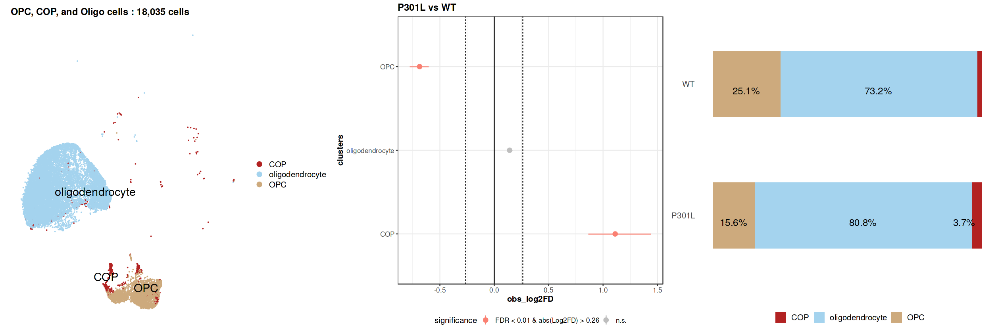

In [111]:

options(repr.plot.width=21, repr.plot.height=7)
plot_grid(p1[[1]], p1[[2]], p1[[3]], ncol=3) 



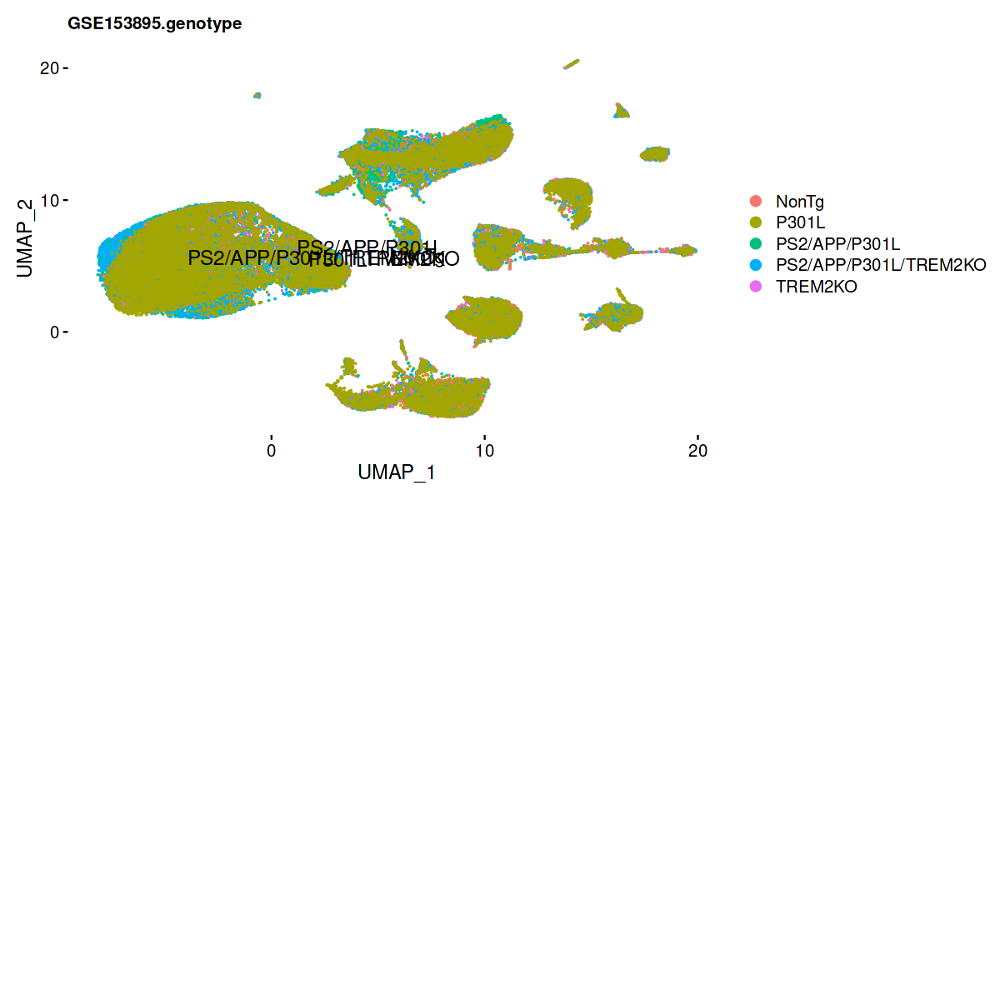

In [131]:

plot_grid(p1[[2]], p1[[3]], ncol=1)
ggsave("/home/choelab/working/OL_sorted/results/ref_results/fig1-5-P301L.pdf", device = "pdf", plot = p1[[1]], width = 10, height = 10, units = "in", dpi = 500)
ggsave("/home/choelab/working/OL_sorted/results/ref_results/fig1-6-P301L.pdf", device = "pdf", plot = p1[[2]], width = 10, height = 10, units = "in", dpi = 500)
ggsave("/home/choelab/working/OL_sorted/results/ref_results/fig1-7-P301L.pdf", device = "pdf", plot = p1[[3]], width = 10, height = 10, units = "in", dpi = 500)


In [112]:

Idents(GSE153895.merge.sub.oligo) <- "GSE153895.celltype2"
COP.OPC.marker <- FindMarkers(GSE153895.merge.sub.oligo, assay = "SCT", ident.1 = "COP", ident.2="OPC", min.pct = 0.001, logfc.threshold = 0.001)
selgene <- c(rownames(arrange(COP.OPC.marker, desc(avg_log2FC)))[1:6], rownames(arrange(COP.OPC.marker, avg_log2FC))[1:6])

[1] 117

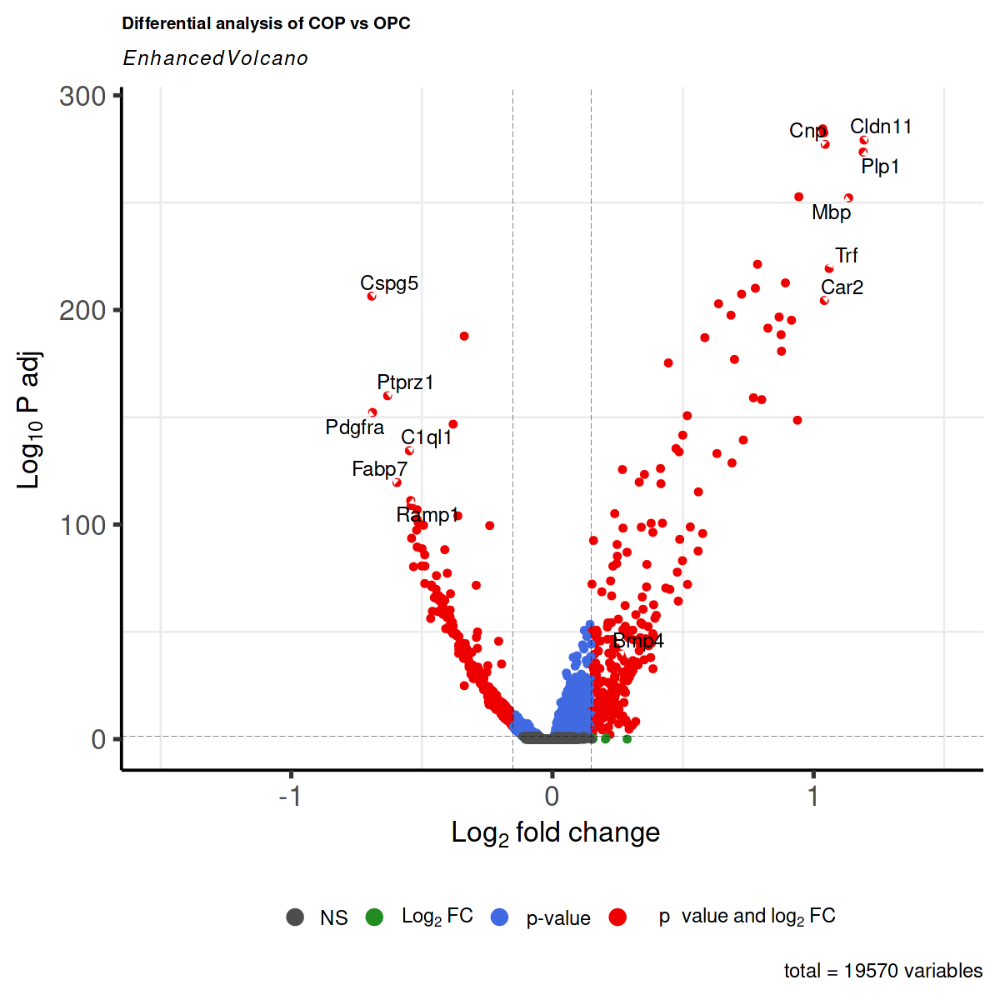

In [130]:
#   keyvals.shape <- ifelse(drv1_$gene %in% top_up1, 24, ifelse(drv1_$gene %in% top_dn1, 25, 20))
#   names(keyvals.shape) <- ifelse(drv1_$gene %in% top_up1, "Up", ifelse(drv1_$gene %in% top_dn1, "Down", "ns"))
#   keyvals.colour <- ifelse((drv1_$avg_log2FC < -fc) & (drv1_$p_val_adj < p.adj), 'royalblue', ifelse((drv1_$avg_log2FC > fc) & (drv1_$p_val_adj < p.adj), 'red', 'lightgrey'))
#   keyvals.colour[drv1_$gene %in% before.gene] <- 'forestgreen'        
#   keyvals.colour[is.na(keyvals.colour)] <- 'lightgrey'
#   names(keyvals.colour)[keyvals.colour == 'lightgrey'] <- 'ns'
#   names(keyvals.colour)[keyvals.colour == 'forestgreen'] <- 'Both'
#   names(keyvals.colour)[keyvals.colour == 'red'] <- 'Up genes'
#   names(keyvals.colour)[keyvals.colour == 'royalblue'] <- 'Down genes'
    
library(EnhancedVolcano)
options(repr.plot.width=10, repr.plot.height=10)

p1[[4]] <- EnhancedVolcano(COP.OPC.marker,
                        lab = rownames(COP.OPC.marker),
                        x = 'avg_log2FC',
                        y = 'p_val_adj',
                        xlim = c(-1.5, 1.5),
                        # ylim = c(-1, 10),
                        title =  paste0("Differential analysis of COP vs OPC " ),
                        # subtitle = class[1],
                        xlab = bquote(~Log[2]~ 'fold change'),
                        ylab = bquote(~-Log[10]~ 'P adj'),
                        # xlim = c(-xlims[1],xlims[1]),
                        pCutoff = 0.05,
                        FCcutoff = 0.15,
                        pointSize = 2,
                        selectLab = c(selgene,"Bmp4") ,
                        # shapeCustom = keyvals.shape,
                        # colCustom = keyvals.colour,
                        # col=c("grey30", "forestgreen", "royalblue", "red2"),
                        #                colCustom = keyvals,
                        colAlpha = 1,
                        # legendPosition = 'none',
                        drawConnectors = TRUE,
                        widthConnectors = 0.05,
                        colConnectors = 'grey',
                        labSize = 5,
                        # labCol = "black",
                        axisLabSize = 20,
                        titleLabSize = 12,
                        # subtitleLabSize = 10,
                        legendPosition = 'bottom',
                        # caption = paste0("up = ", length(top_up1) , "\n down = ", length(top_dn1), "\n common = ", length(before.gene)),
                        # captionLabSize = 10,
                        cutoffLineWidth = 0.1,
                        gridlines.major = F,
                        gridlines.minor = T,
                        maxoverlapsConnectors =10)
    
p1[[4]]

In [132]:

ggsave("/home/choelab/working/OL_sorted/results/ref_results/fig1-8-P301L.pdf", device = "pdf", plot = p1[[4]], width = 10, height = 10, units = "in", dpi = 500)

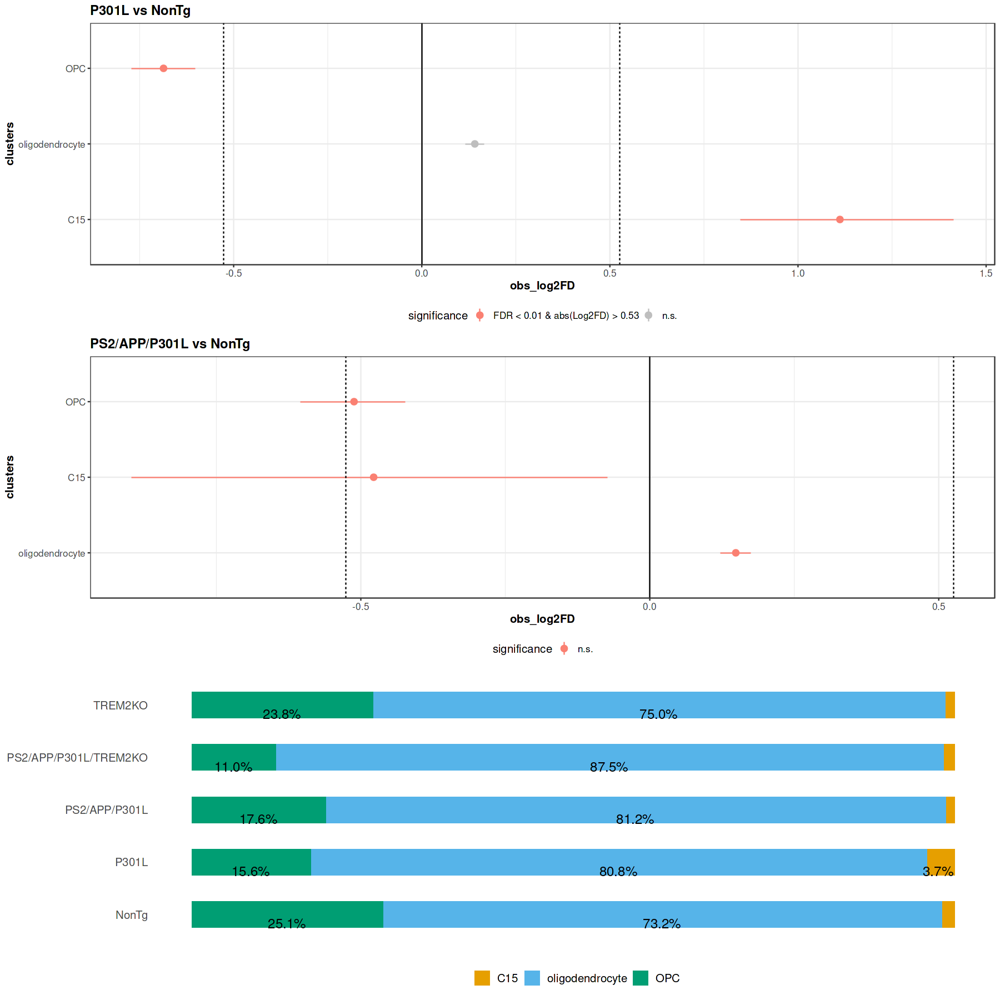

In [30]:
require("scProportionTest")
prop_test <- sc_utils(GSE153895.merge.oligo)

prop_test.1 <- permutation_test(
  prop_test, cluster_identity = "GSE153895.celltype",
  sample_1 = "NonTg", sample_2 = "P301L",
  sample_identity = "GSE153895.genotype"
)

p1_e <- permutation_plot(prop_test.1,FDR_threshold = 0.01,log2FD_threshold = log2(1.44))+
  theme(legend.position = 'bottom', 
        legend.title = element_text(size = 12, hjust = 0),
        legend.text = element_text(size = 10),
        axis.title = element_text(size = 12, face = "bold"),
        axis.text = element_text(size = 10))+
  ggtitle("P301L vs NonTg") +
  theme(plot.title = element_text(size = 14, face = "bold",hjust = 0))

prop_test.1 <- permutation_test(
  prop_test, cluster_identity = "GSE153895.celltype",
  sample_1 = "NonTg", sample_2 = "PS2/APP/P301L",
  sample_identity = "GSE153895.genotype"
)

p1_e_ <- permutation_plot(prop_test.1,FDR_threshold = 0.01,log2FD_threshold = log2(1.44))+
  theme(legend.position = 'bottom', 
        legend.title = element_text(size = 12, hjust = 0),
        legend.text = element_text(size = 10),
        axis.title = element_text(size = 12, face = "bold"),
        axis.text = element_text(size = 10))+
  ggtitle("PS2/APP/P301L vs NonTg") +
  theme(plot.title = element_text(size = 14, face = "bold",hjust = 0))

options(repr.plot.width=15, repr.plot.height=10)

library(dittoSeq)
pt <- prop.table(table(GSE153895.merge.oligo$GSE153895.celltype, GSE153895.merge.oligo$GSE153895.genotype), margin = 2)
pt <- as.data.frame(pt)
pt$Var1 <- as.character(pt$Var1)

# selLabel<-intersect(prop_test@results$permutation$clusters[prop_test@results$permutation$FDR<0.01],
#                     prop_test@results$permutation$clusters[abs(prop_test@results$permutation$obs_log2FD)>0.53])
# library(ggrepel)
# prop.table(table(Idents(combined), combined$id_new), margin = 2)
p1_f <- ggplot(pt, aes(x = Var2, y = Freq, fill = reorder(Var1,1:dim(pt)[1]), label = ifelse(Freq>0.025,scales::percent(Freq, accuracy=.1),""))) +
  theme_bw(base_size = 15) +
  theme(panel.border = element_blank(), panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))+
  geom_col(position = "fill", width = 0.5) +
  geom_text_repel(position = position_fill(vjust = 0.5), 
            vjust=0.2,
            hjust=-0.1,
            size = 5,
            max.overlaps = 10,
            box.padding = unit(0.5, "lines"),
            direction = "y") + 
  theme(axis.title = element_blank(), axis.line = element_blank(),
        axis.ticks = element_blank(), axis.text.x = element_blank(),
        plot.title = element_text(size = 14, face = "bold",hjust = 0)) +
  scale_fill_manual(values = dittoColors()) +
  theme(legend.position = 'bottom')+
  theme(legend.title = element_blank())+  coord_flip()

options(repr.plot.width=15, repr.plot.height=15)

plot_grid(p1_e,p1_e_, p1_f, ncol=1)

In [36]:
COP$GSE153895.genotype

CELL3803569             CELL3803581             CELL3803607 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3803608             CELL3803639             CELL3803661 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3803710             CELL3803738             CELL3803820 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3803830             CELL3803911             CELL3803985 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3803986             CELL3804003             CELL3804049 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3804161             CELL3804321             CELL3804325 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3804712             CELL3804999             CELL3805748 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3806240             CELL3806940             CELL3807155 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3807515             CELL3808678             CELL3808727 
        "PS2/APP/P301L"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3809025             CELL3809029             CELL3809048 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809052             CELL3809060             CELL3809064 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809067             CELL3809068             CELL3809069 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809077             CELL3809079             CELL3809104 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809115             CELL3809119             CELL3809120 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809129             CELL3809130             CELL3809141 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809161             CELL3809164             CELL3809168 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809197             CELL3809200             CELL3809210 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809214             CELL3809241             CELL3809267 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809279             CELL3809326             CELL3809424 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3809591             CELL3809773             CELL3809840 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3810118             CELL3810262             CELL3810430 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3810847             CELL3810860             CELL3811150 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3811263             CELL3811730             CELL3811833 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3812223             CELL3812286             CELL3812367 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3812417             CELL3812642             CELL3813515 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3813575             CELL3813594             CELL3813691 
"PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" "PS2/APP/P301L/TREM2KO" 
            CELL3813719             CELL3828111             CELL3828123 
"PS2/APP/P301L/TREM2KO"         "PS2/APP/P301L"         "PS2/APP/P301L" 
            CELL3828140             CELL3828146             CELL382815

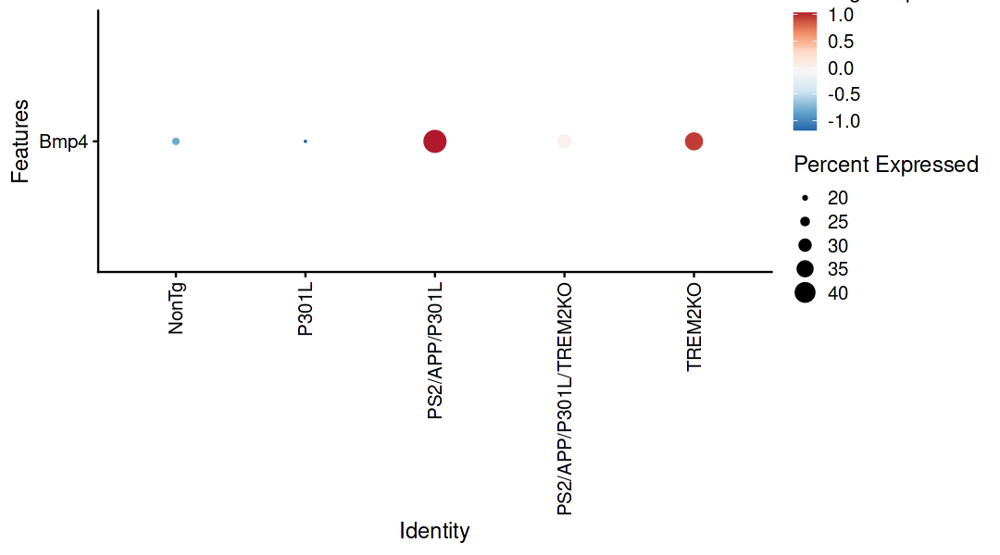

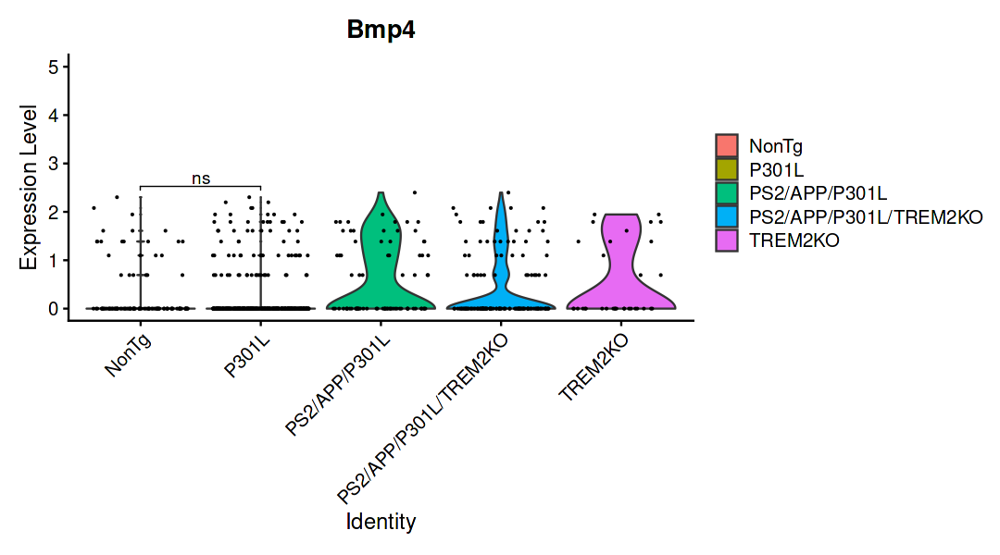

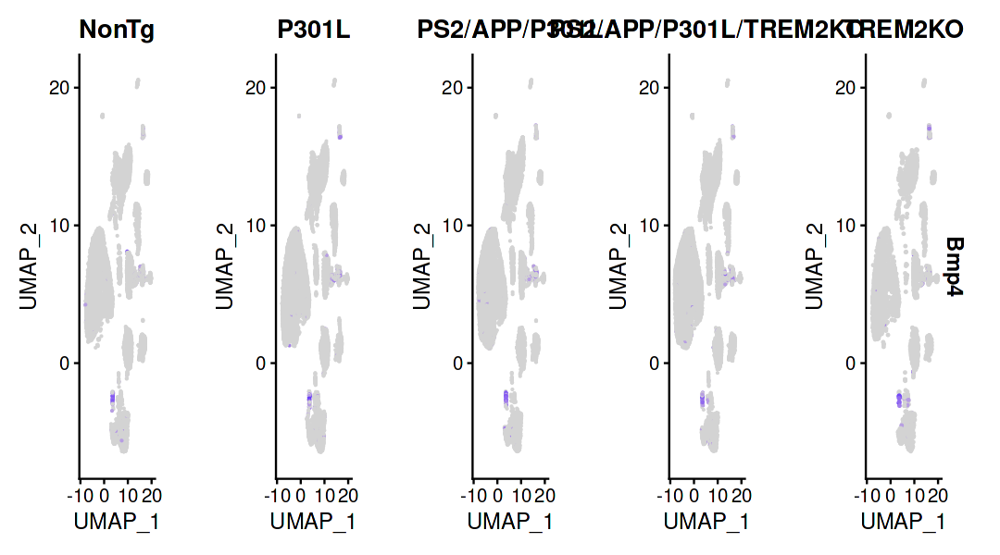

In [38]:
# options(repr.plot.width=16, repr.plot.height=8)
# DotPlot(GSE160512.merge, group.by = "GSE160512.celltype", features = c("Bmp4"), split.by="GSE160512.genotype", assay="SCT" , cols ="RdBu") + coord_flip() + 
#            theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
COP <- GSE153895.merge[,GSE153895.merge$GSE153895.celltype == "C15"]
options(repr.plot.width=9, repr.plot.height=5)
DotPlot(COP, group.by = "GSE153895.genotype", features = c("Bmp4"),  assay="SCT" , cols ="RdBu") + coord_flip() + 
           theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

   VlnPlot(COP, features = "Bmp4",pt.size = 0.1, group.by = "GSE153895.genotype",
            y.max = 5 # add the y-axis maximum value - otherwise p-value hidden
    ) + stat_compare_means(comparisons = list(c("NonTg", "P301L")), label = "p.signif")
FeaturePlot(GSE153895.merge, features = c("Bmp4"), split.by = "GSE153895.genotype")

In [33]:
GSE153895.merge$genotype

ERROR: Error: Cannot find 'genotype' in this Seurat object


In [39]:
################# path - OL sorted

pathIMZ <- file.path("/home","choelab","working","OL_sorted","data")
fileListCNTs <- list.files(pathIMZ, pattern = ".counts.tsv")
fileListMETRICS <- list.files(pathIMZ, pattern = ".metrics.tsv")

path_in_counts.raw <- paste0(pathIMZ,"/",fileListCNTs)
path_in_metrics.raw <- paste0(pathIMZ,"/",fileListMETRICS)


path_metrics <- c(path_in_metrics.raw[grepl("WT",path_in_metrics.raw)],
                  path_in_metrics.raw[grepl("Tg6799",path_in_metrics.raw)])

path_counts<-c(path_in_counts.raw[grepl("WT",path_in_counts.raw)],
               path_in_counts.raw[grepl("Tg6799",path_in_counts.raw)])

################# read data
library(scDblFinder)
library(indRop)
require(doParallel) 
require(foreach)
library(data.table)

system <- Sys.info()['sysname']
cores <- parallel::makeCluster(detectCores(), type='PSOCK')
cl <- NULL

  cl <- parallel::makeCluster(getOption('cl.cores', cores))
  doParallel::registerDoParallel(cl)
  ###################################################################
  clusterEvalQ(cl, c( library(Seurat), library(data.table),library(SingleCellExperiment) ,library(indRop),library(scDblFinder)))
  clusterExport(cl, c("readIndrop","fread","SingleCellExperiment","scDblFinder","CreateSeuratObject"),
                envir=environment())
  
  data.OLsort <- parallel::parLapply(cl,path_metrics,  function(path) {
    metric_OLsort      <- as.matrix(fread(path, header = TRUE, sep = '\t',verbose=FALSE))
    uni_align_OLsort <- which(as.numeric(metric_OLsort[,"UMIFM"]) >= 1000)
    as.character(metric_OLsort[uni_align_OLsort])
  })
  
  
  cacheParallel.OLsort <- function() {
    parallel::parLapply(cl,path_counts, function(path) {
      return(readIndrop(path))
    })
  }
  
  elapse <- base::system.time(filtereddata.OLsort<- cacheParallel.OLsort())
  
  
  OL_sort<-foreach::foreach(exponent = 1:length(path_counts), .packages="Seurat")  %dopar% {
    dt<-c()
    runData<-c()
    filt <- which(colnames(filtereddata.OLsort[[exponent]]) %in% data.OLsort[[exponent]])
    if(length(filt) > 1){
        dt<-filtereddata.OLsort[[exponent]][,filt]
        print(dim(dt))
        runData<-dt
        print(dim(runData))
        runData.sce <- SingleCellExperiment(assays = list(counts = runData))
        tryCatch(runData.sce <- scDblFinder(runData.sce),
                 error = function(e) print("Error"),
                 warning = function(w) print("Warning"),
                 finally = NULL)
        

        count <- runData
        
        if(!is.null(runData.sce$scDblFinder.class)){
            doubletlists <- colnames(runData.sce)[which(runData.sce$scDblFinder.class=="doublet")]
            if(length(doubletlists) > 0){
                count <- runData[,-which(colnames(dt) %in% doubletlists)]
            }
        }
        
        
        # count
        CreateSeuratObject(counts = count, min.cells = 10)


    } else{
        
    }
  }
  
  
  

################################################################
on.exit(stopCluster(cl))
# stopCluster(cl)
# detach("package:indRop", unload=TRUE)
# detach("package:scDblFinder", unload=TRUE)



Loading required package: doParallel

Loading required package: foreach


Attaching package: ‘foreach’


The following objects are masked from ‘package:purrr’:

    accumulate, when


Loading required package: iterators



[[1]]
 [1] "sp"                   "SeuratObject"         "Seurat"              
 [4] "stats"                "graphics"             "grDevices"           
 [7] "utils"                "datasets"             "methods"             
[10] "base"                 "data.table"           "sp"                  
[13] "SeuratObject"         "Seurat"               "stats"               
[16] "graphics"             "grDevices"            "utils"               
[19] "datasets"             "methods"              "base"                
[22] "SingleCellExperiment" "SummarizedExperiment" "Biobase"             
[25] "GenomicRanges"        "GenomeInfoDb"         "IRanges"             
[28] "S4Vectors"            "BiocGenerics"         "stats4"              
[31] "MatrixGenerics"       "matrixStats"          "data.table"          
[34] "sp"                   "SeuratObject"         "Seurat"              
[37] "stats"                "graphics"             "grDevices"           
[40] "utils"                "datasets"             "methods"             
[43] "base"                 "indRop"               "SingleCellExperiment"
[46] "SummarizedExperiment" "Biobase"              "GenomicRanges"       
[49] "GenomeInfoDb"         "IRanges"              "S4Vectors"           
[52] "BiocGenerics"         "stats4"               "MatrixGenerics"      
[55] "matrixStats"          "data.table"           "sp"                  
[58] "SeuratObject"         "Seurat"               "stats"               
[61] "graphics"             "grDevices"            "utils"               
[64] "datasets"             "methods"              "base"                
[67] "scDblFinder"          "indRop"               "SingleCellExperiment"
[70] "SummarizedExperiment" "Biobase"              "GenomicRanges"       
[73] "GenomeInfoDb"         "IRanges"              "S4Vectors"           
[76] "BiocGenerics"         "stats4"               "MatrixGenerics"      
[79] "matrixStats"          "data.table"           "sp"                  
[82] "SeuratObject"         "Seurat"               "stats"               
[85] "graphics"             "grDevices"            "utils"               
[88] "datasets"             "methods"              "base"                

[[2]]
 [1] "sp"                   "SeuratObject"         "Seurat"              
 [4] "stats"                "graphics"             "grDevices"           
 [7] "utils"                "datasets"             "methods"             
[10] "base"                 "data.table"           "sp"                  
[13] "SeuratObject"         "Seurat"               "stats"               
[16] "graphics"             "grDevices"            "utils"               
[19] "datasets"             "methods"              "base"                
[22] "SingleCellExperiment" "SummarizedExperiment" "Biobase"             
[25] "GenomicRanges"        "GenomeInfoDb"         "IRanges"             
[28] "S4Vectors"            "BiocGenerics"         "stats4"              
[31] "MatrixGenerics"       "matrixStats"          "data.table"          
[34] "sp"                   "SeuratObject"         "Seurat"              
[37] "stats"                "graphics"             "grDevices"           
[40] "utils"                "datasets"             "methods"             
[43] "base"                 "indRop"               "SingleCellExperiment"
[46] "SummarizedExperiment" "Biobase"              "GenomicRanges"       
[49] "GenomeInfoDb"         "IRanges"              "S4Vectors"           
[52] "BiocGenerics"         "stats4"               "MatrixGenerics"      
[55] "matrixStats"          "data.table"           "sp"                  
[58] "SeuratObject"         "Seurat"               "stats"               
[61] "graphics"             "grDevices"            "utils"               
[64] "datasets"             "methods"              "base"                
[67] "scDblFinder"          "indRop"               "SingleCellExperiment"
[70] "SummarizedExperiment" "Biobase"              "GenomicRanges

In [56]:

################# OL sorted
names(OL_sort) <- sapply(str_split(path_counts, "/"), function(x){str_split(x[7], "\\.")[[1]][1]})
OL_sort_ <- compact(sapply(names(OL_sort), function(x){
    if(!is.null(OL_sort[[x]]) && dim(OL_sort[[x]])[2] > 100){
        OL_sort[[x]]$basic <- "OL sorted"
        OL_sort[[x]]$id <- x
        OL_sort[[x]]$new_ident <- paste0(x, "_", ifelse(grepl("WT",toupper(x)),"WT","TG"))
        OL_sort[[x]]$genetype <- ifelse(grepl("WT",toupper(x)),"WT","TG")
        OL_sort[[x]][["percent.mt"]] <- PercentageFeatureSet(OL_sort[[x]], pattern = paste0(c(mt.genes,"^mt."), collapse = "|"))
        OL_sort[[x]][["percent.ribosomal"]] <- PercentageFeatureSet(OL_sort[[x]], pattern = "^Rpl|^Rps")
        OL_sort[[x]][["percent.hb"]] <- PercentageFeatureSet(OL_sort[[x]], pattern = paste0('^Hba.a1$|^Hba.a2$|^Hba.x$|^Hbb.bh1$|^Hbb.bh2$|^Hbb.bs$|^Hbb.bt$|^Hbq1b$|^Hbb.y$|^Hbq1a$'))
        # paste0(unique(unlist(lapply(OL_sort, function(x){grep("^Hb" ,rownames(x), value = T)}))), collapse = "|" )

        OL_sort[[x]]$log10GenesPerUMI <- log10(OL_sort[[x]]$nFeature_RNA) / log10(OL_sort[[x]]$nCount_RNA)
        OL_sort[[x]] <- processA(OL_sort[[x]])
        # if(!is.null(OL_sort[[x]]) && dim(OL_sort[[x]])[2] > 100){
             OL_sort[[x]]
        # } else{}
        # OL_sort[[x]]
    }  
    
}))


In [47]:
sum(GSE153895.obj.OL[[1]]$percent.hb)

[1] 0

In [57]:
data.list2 <- sapply(c(OL_sort_,GSE153895.obj.OL), FUN = function(x) {
     
                x %>% 
                  SCTransform(assay = 'RNA',      
                              new.assay.name = 'SCT',  
                              vars.to.regress = c('percent.mt','nFeature_RNA','percent.hb'),
                              verbose = T)  

    })

OLs.merge.features <- SelectIntegrationFeatures(object.list = data.list2, nfeatures = 1000)
OLs.merge.features <- setdiff(OLs.merge.features, grep(c("^mt-|^mt.|^Hba1|^Hba2|^Hbb|^Hbd|^Hbg1|^Hbg2|^Hbm|^Hbq1"), OLs.merge.features, value =T))

OLs.merge3 <- merge(data.list2[[1]], y= c(data.list2[2:length(data.list2)]),project = 'merged',merge.data=T)

VariableFeatures(OLs.merge3) <- OLs.merge.features

pcs <- 10
set.seed(1234)
library(harmony)
DefaultAssay(OLs.merge3) <- "SCT"

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 31228 by 1736

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1736 cells



  |======================================================================| 100%


Found 163 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 31228 genes



  |======================================================================| 100%


Computing corrected count matrix for 31228 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.149164 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 22090 by 578

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 578 cells



  |======================================================================| 100%


Found 116 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 22090 genes



  |======================================================================| 100%


Computing corrected count matrix for 22090 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 7.539065 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 30839 by 2139

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2139 cells



  |======================================================================| 100%


Found 69 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 30839 genes



  |======================================================================| 100%


Computing corrected count matrix for 30839 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 29.82459 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 30758 by 2064

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2064 cells



  |======================================================================| 100%


Found 79 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 30758 genes



  |======================================================================| 100%


Computing corrected count matrix for 30758 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 27.19838 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 30928 by 1955

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1955 cells



  |======================================================================| 100%


Found 94 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 30928 genes



  |======================================================================| 100%


Computing corrected count matrix for 30928 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 21.45569 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 32480 by 2064

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2064 cells



  |======================================================================| 100%


Found 69 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 32480 genes



  |======================================================================| 100%


Computing corrected count matrix for 32480 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 32.20554 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 16145 by 263

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 263 cells



  |======================================================================| 100%


Found 130 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 16145 genes



  |======================================================================| 100%


Computing corrected count matrix for 16145 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.256425 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 32107 by 2492

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2492 cells



  |======================================================================| 100%


Found 117 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 32107 genes



  |======================================================================| 100%


Computing corrected count matrix for 32107 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 30.7188 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 17878 by 2922

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2922 cells



  |======================================================================| 100%


Found 153 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17878 genes



  |======================================================================| 100%


Computing corrected count matrix for 17878 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 31.93782 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18098 by 3013

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 3013 cells



  |======================================================================| 100%


Found 137 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18098 genes



  |======================================================================| 100%


Computing corrected count matrix for 18098 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 27.19086 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 16444 by 1502

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1502 cells



  |======================================================================| 100%


Found 122 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 16444 genes



  |======================================================================| 100%


Computing corrected count matrix for 16444 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 13.96678 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18624 by 3037

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 3037 cells



  |======================================================================| 100%


Found 96 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18624 genes



  |======================================================================| 100%


Computing corrected count matrix for 18624 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 27.14071 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 17191 by 2068

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2068 cells



  |======================================================================| 100%


Found 120 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17191 genes



  |======================================================================| 100%


Computing corrected count matrix for 17191 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 18.96526 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 17562 by 2365

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2365 cells



  |======================================================================| 100%


Found 124 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17562 genes



  |======================================================================| 100%


Computing corrected count matrix for 17562 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 21.28958 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18215 by 3442

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 3442 cells



  |======================================================================| 100%


Found 127 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18215 genes



  |======================================================================| 100%


Computing corrected count matrix for 18215 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 31.80402 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 17637 by 2600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2600 cells



  |======================================================================| 100%


Found 129 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17637 genes



  |======================================================================| 100%


Computing corrected count matrix for 17637 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 23.29898 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18304 by 2931

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2931 cells



  |======================================================================| 100%


Found 142 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18304 genes



  |======================================================================| 100%


Computing corrected count matrix for 18304 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 26.07447 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18351 by 3788

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 3788 cells



  |======================================================================| 100%


Found 134 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18351 genes



  |======================================================================| 100%


Computing corrected count matrix for 18351 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 41.46766 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18796 by 5158

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 131 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18796 genes



  |======================================================================| 100%


Computing corrected count matrix for 18796 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.167888 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 18759 by 4139

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 4139 cells



  |======================================================================| 100%


Found 115 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18759 genes



  |======================================================================| 100%


Computing corrected count matrix for 18759 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 36.84048 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, nFeature_RNA, percent.hb

Centering data matrix

Set default assay to SCT



In [58]:


set.seed(1234)
library(harmony)
DefaultAssay(OLs.merge3) <- "SCT"
pcs <- 1:20

OLs.merge3.id <-OLs.merge3 %>%
          RunPCA(verbose = FALSE, features = VariableFeatures(OLs.merge3)) %>%
          RunHarmony(group.by=c("id"), assay.use = "SCT", dims=pcs) %>% 
          RunUMAP(reduction = "harmony", umap.method = "umap-learn", dims=pcs) %>%
          FindNeighbors(reduction = "harmony", dims=pcs) %>%
          FindClusters(resolution = seq(0.1,1,0.1), algorithm = 2)


Harmony 1/10

Harmony 2/10

Harmony converged after 2 iterations

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 50256
Number of edges: 1404834

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9399
Number of communities: 6
Elapsed time: 13 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 50256
Number of edges: 1404834

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9062
Number of communities: 10
Elapsed time: 12 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 50256
Number of edges: 1404834

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.8872
Number of communities: 12
Elapsed time: 13 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 50256
Number of edges: 1404834

Running Louvain algorithm with multilevel refinemen

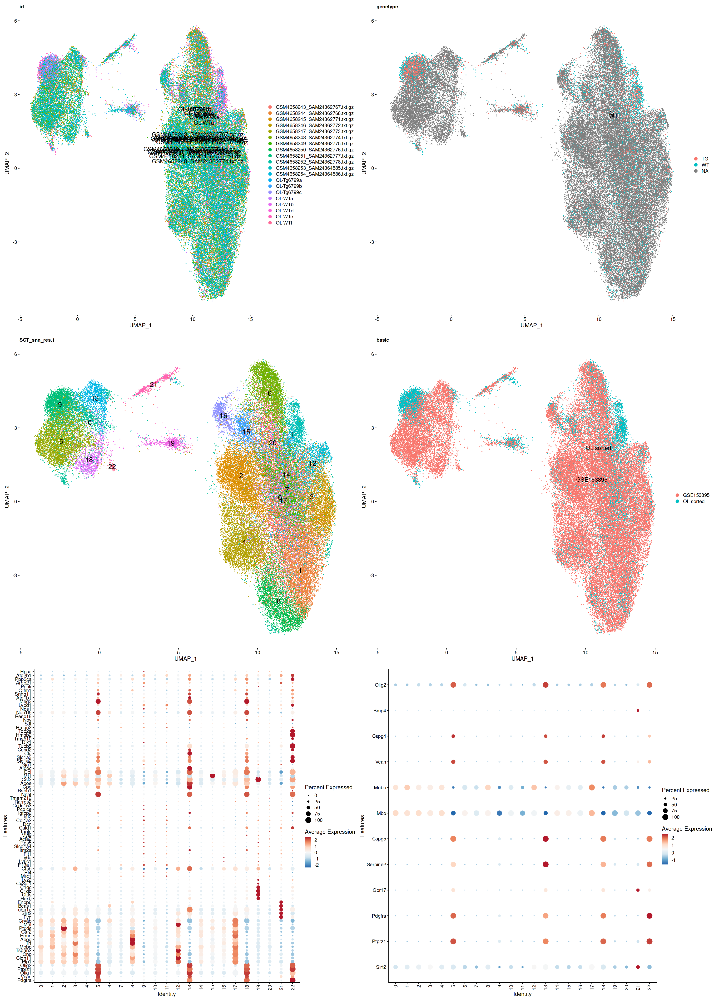

In [59]:

options(repr.plot.width = 25, repr.plot.height = 35)
p1 <- list()
p1[[1]] <- DimPlot(OLs.merge3.id, reduction = "umap", group.by = "id", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0),  axis.line = element_blank())
p1[[2]] <- DimPlot(OLs.merge3.id, group.by = "genetype", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0), axis.line = element_blank())
p1[[4]] <- DimPlot(OLs.merge3.id, group.by = "SCT_snn_res.1", label =T, label.size = 6, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0), legend.position = "none", axis.line = element_blank())
p1[[5]] <- DimPlot(OLs.merge3.id, group.by = "basic", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0),  axis.line = element_blank())
p1[[6]] <- DotPlot(OLs.merge3.id, group.by = "SCT_snn_res.1", features = unique(GSE118918.marker), assay="SCT" , cols ="RdBu") + coord_flip() + 
           theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
p1[[7]] <- DotPlot(OLs.merge3.id, group.by = "SCT_snn_res.1", features = c("Sirt2","Ptprz1","Pdgfra","Gpr17","Serpine2","Cspg5",
                                                                             "Mbp","Mobp",
                                                                             "Vcan","Cspg4","Bmp4","Olig2" ), assay="SCT" , cols ="RdBu") + coord_flip() + 
           theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
plot_grid(p1[[1]],p1[[2]], p1[[4]], p1[[5]], p1[[6]], p1[[7]], ncol=2) 



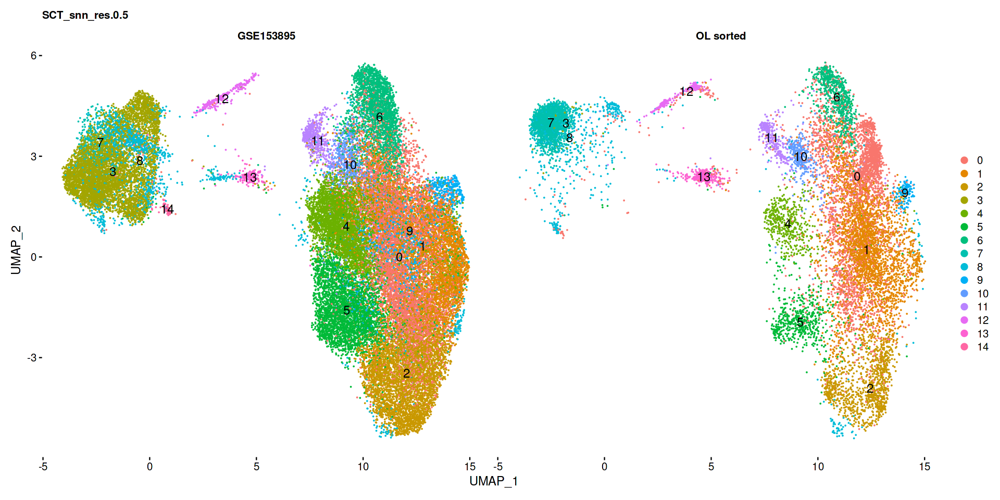

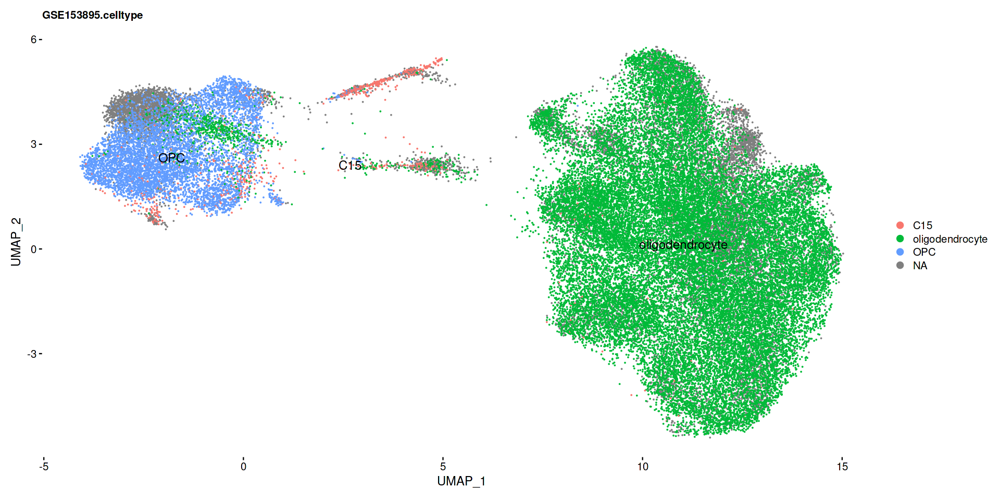

In [60]:
options(repr.plot.width = 16, repr.plot.height = 8)
DimPlot(OLs.merge3.id, group.by = "SCT_snn_res.0.5", split.by="basic", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0),  axis.line = element_blank())
DimPlot(OLs.merge3.id, group.by = "GSE153895.celltype", label =T, label.size = 5, pt.size = 0.01,raster=FALSE) + 
           theme(plot.title = element_text(size = 12, face = "bold",hjust = 0),  axis.line = element_blank())